# **Dataset columns description:**

1. **Vessel**: This column contains the name of the ship, in this case, "BRAVERUS".
2. **Voyage**: This column contains the voyage number, which is unique for each journey of the vessel.
3. **Dated**: This column contains the date that the vessel started its journey.
4. **To**: This column contains the destination of the vessel.
5. **Steam**: This column contains the steam hours, which is the number of hours the ship's steam engine was in operation. Measurement - hours.
6. **RPM**: This column contains the revolutions per minute of the ship's engine. Measurement - revolutions per minute. Normal is typically between 0 and 2000.
7. **Speed**: This column contains the speed of the ship in knots. Measurement - knots. Normal is usually between 0 and 25 knots.
8. **STW (Speed Through Water)**: This column contains the actual speed of the ship through the water, accounting for currents and other factors. Measurement - knots. Normal is usually between 0 and 25 knots.
9. **M/E HFO CONS, M/E LSHFO CONS, M/E MDO CONS, M/E LSMDO CONS, M/E MGO CONS, M/E LSMGO CONS, D/G HFO CONS, D/G LSHFO CONS, D/G MDO CONS, D/G LSMDO CONS, D/G MGO CONS, D/G LSMGO CONS, BOIL. HFO CONS, BOIL. SHFO CONS, BOIL. MDO CONS, BOIL. LSMDO CONS, BOIL. MGO CONS, BOIL. LSMGO CONS**: These columns contain the consumption of different types of fuel by the main engine (M/E), diesel generator (D/G), and boiler (BOIL.). The types of fuel include Heavy Fuel Oil (HFO), Low-Sulfur Heavy Fuel Oil (LSHFO), Marine Diesel Oil (MDO), Low-Sulfur Marine Diesel Oil (LSMDO), Marine Gas Oil (MGO), and Low-Sulfur Marine Gas Oil (LSMGO). Measurement - tons or kg.
10. **WIND**: This column contains information about the wind conditions during the voyage. Measurement - knots or meters per second. Normal is generally between 0 and 50 knots.
11. **SWELL**: This column contains information about the sea swell conditions during the voyage. Measurement - meters. Normal is typically between 0 and 10 meters.
12. **SLIP**: This column contains the slip value, which is the difference between the theoretical and actual speed of the ship. ratio.
13. **CUR SPD (Current Speed)**: This column contains the ship's speed relative to the water current. Measurement - knots. Normal is usually between 0 and 25 knots.
14. **DRAFT FOR (Forward Draft)**: This column contains the depth of the ship's hull below the waterline at the forward end. Measurement - meters. Normal is typically between 0 and 20 meters.
15. **DRAFT AFT (Aft Draft)**: This column contains the depth of the ship's hull below the waterline at the aft end. Measurement - meters. Normal is typically between 0 and 20 meters.
16. **OBS DIST (Observation Distance)**: This column contains the distance from the observer (e.g., radar) to a target. Measurement - nautical miles
17. **OPERATION**: This column describes the ship's operational status or activity (e.g., cruising, anchoring, loading, etc.).
18. **CARGOCARRIED**: This column indicates the type of cargo carried by the ship during the voyage.

# **Imports and Data Uploading**

## Imports

In [ ]:
# Import essential libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Libraries for data splitting and machine learning model fitting
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Libraries for advanced models and anomaly detection
from sklearn.ensemble import IsolationForest, RandomForestRegressor
from sklearn.cluster import DBSCAN, KMeans
from sklearn.mixture import GaussianMixture

# Libraries for preprocessing and dimensionality reduction
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA

# General utility libraries
import numpy as np
import statsmodels.api as sm
from statsmodels.formula.api import ols

# Metrics and utilities for clustering evaluation and combinations
from sklearn.metrics import silhouette_score
from itertools import product, combinations
from mpl_toolkits.mplot3d import Axes3D

## Data Uploading and creating a Dataframe

In [ ]:
# Load the CSV file into a DataFrame
file_path = '/content/BRAVERUS_20150101_TO_20181231.csv'
df = pd.read_csv(file_path)

# **Data Handling**

##Identify Columns with Uniform Values

Identifies columns in the dataframe where all rows have the same value. Columns with a single unique value offer no variance and may not contribute useful information for analysis or modeling.

In [ ]:
# Check for columns where all values are the same
same_value_columns = [col for col in df.columns if df[col].nunique() == 1]

# Print the result
if same_value_columns:
    print(f"Columns with the same value in all rows: {same_value_columns}")
else:
    print("No columns with the same value in all rows.")

Columns with the same value in all rows: ['VESSEL', 'M/E MDO CONS.', 'M/E LSMDO CONS.', 'D/G MDO CONS.', 'D/G LSMDO CONS.', 'BOIL. MDO CONS.', 'BOIL. LSMDO CONS.']


## Remove Uniform Value Columns
Columns with uniform values (a single unique value) are eliminated because they don't contribute any valuable information to the analysis.

In [ ]:
# Find columns where all values are the same
same_value_columns = [col for col in df.columns if df[col].nunique() == 1]

# Drop those columns from the DataFrame
df.drop(columns=same_value_columns, inplace=True)

# Print the remaining columns
print(f"Columns after removal: {df.columns}")

Columns after removal: Index(['VOYAGE', 'DATED', 'TO', 'STEAM', 'RPM', 'SPEED', 'STW',
       'M/E HFO CONS.', 'M/E LSHFO CONS.', 'M/E MGO CONS.', 'M/E LSMGO CONS.',
       'D/G HFO CONS.', 'D/G LSHFO CONS.', 'D/G MGO CONS.', 'D/G LSMGO CONS.',
       'BOIL. HFO CONS.', 'BOIL. SHFO CONS.', 'BOIL. MGO CONS.',
       'BOIL. LSMGO CONS.', 'WIND', 'SWELL', 'SLIP', 'CUR SPD', 'DRAFT FOR',
       'DRAFT AFT', 'OBS DIST', 'OPERATION', 'CARGOCARRIED'],
      dtype='object')


## Create Summed Oil Parameters Column

Sums a few columns pertaining to oil usage to produce a new column called "summed oil parameters." To simplify the data, the individual columns are removed after the sum is calculated.

In [ ]:
# List of columns to sum (based on the image)
columns_to_sum = [
    'M/E HFO CONS.', 'M/E LSHFO CONS.', 'M/E MGO CONS.', 'M/E LSMGO CONS.',
       'D/G HFO CONS.', 'D/G LSHFO CONS.', 'D/G MGO CONS.', 'D/G LSMGO CONS.',
       'BOIL. HFO CONS.', 'BOIL. SHFO CONS.', 'BOIL. MGO CONS.',
       'BOIL. LSMGO CONS.'
]

# Creating the new column by summing the specified columns
df["summed oil parameters"] = df[columns_to_sum].sum(axis=1)

#Drop all the oil columns parametes after summing up the total
df.drop(columns = columns_to_sum, inplace = True)


## Check Data Types of Columns

Each column is classified as categorical or continuous (numeric) based on the data type. This data serves to inform subsequent processing and encoding procedures.

In [ ]:
# Check each column to determine if it is categorical or continuous (numeric)
for column in df.columns:
    if pd.api.types.is_categorical_dtype(df[column]) or pd.api.types.is_object_dtype(df[column]):
        print(f"{column} is categorical and contains {df[column].nunique()} unique values")
    elif pd.api.types.is_numeric_dtype(df[column]):
        print(f"{column} is continuous (numeric)")


VOYAGE is categorical and contains 58 unique values
DATED is categorical and contains 1459 unique values
TO is categorical and contains 40 unique values
STEAM is continuous (numeric)
RPM is continuous (numeric)
SPEED is continuous (numeric)
STW is continuous (numeric)
WIND is continuous (numeric)
SWELL is continuous (numeric)
SLIP is continuous (numeric)
CUR SPD is continuous (numeric)
DRAFT FOR is continuous (numeric)
DRAFT AFT is continuous (numeric)
OBS DIST is continuous (numeric)
OPERATION is categorical and contains 6 unique values
CARGOCARRIED is continuous (numeric)
summed oil parameters is continuous (numeric)


<ipython-input-7-ca0c51fe0954>:3: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(df[column]) or pd.api.types.is_object_dtype(df[column]):


## Define Categorical Variables
Here, a list of categorical variables is defined, which will later be used for encoding or other specific processing.

In [ ]:
# Define the categorical variables for encoding and processing
categorial_variables = ['VOYAGE', 'DATED', 'TO', 'OPERATION']

## Define Function to Determine Season from Date
Defines a helper function, get_season, that returns the season based on a given date. This function will subsequently be used to convert date information into seasonal groups.

In [ ]:
# Function to get the season based on the date
def get_season(date):
    if (date.month == 12 and date.day >= 21) or (date.month <= 3) or (date.month == 3 and date.day < 20):
        return 'winter'
    elif (date.month == 3 and date.day >= 20) or (date.month <= 6 and date.month != 3) or (date.month == 6 and date.day < 21):
        return 'spring'
    elif (date.month == 6 and date.day >= 21) or (date.month <= 9 and date.month != 6) or (date.month == 9 and date.day < 22):
        return 'summer'
    else:
        return 'fall'

## Count Unique Dates
Counts the number of unique values in the DATED column to better understand the variety of dates in the dataset, which may provide insights about date distribution.

In [ ]:
# Count the number of unique values in the 'DATED' column
len(df['DATED'].unique())

1459

## Convert Dates to Seasons and Update Categorical Variables
The DATED column is converted to a seasonal category using the get_season function. After generating the new column, the old DATED column is removed.

In [ ]:
# Convert the 'DATED' column to datetime
df['DATED'] = pd.to_datetime(df['DATED'], infer_datetime_format=True)

# Apply the function to create a new column for seasons
df['SEASON'] = df['DATED'].apply(get_season)

# Drop the 'DATED' column as 'SEASON' now represents the same information
df.drop(columns=['DATED'], inplace=True)

# Replace 'DATED' in the categorical variables list with 'SEASON'
categorial_variables.remove('DATED')
categorial_variables.append('SEASON')

<ipython-input-11-70ecb27e2c52>:2: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['DATED'] = pd.to_datetime(df['DATED'], infer_datetime_format=True)


## Fill Missing Values in Categorical Column
Fills in the missing data in the OPERATION column with the label OTHER.

In [ ]:
# Fill missing values in the 'OPERATION' column with 'OTHER'
df['OPERATION'] = df['OPERATION'].fillna('OTHER')

## Encode Categorical Variables Numerically
Here, categorical variables are converted to numeric format using label encoding, which is necessary for many machine learning algorithms that require numeric input.

In [ ]:
# Create a copy of the DataFrame for numeric processing
df_numeric = df.copy()

# Initialize a label encoder
label_encoder = LabelEncoder()

# Encode each categorical variable with numeric labels
df_numeric['OPERATION'] = label_encoder.fit_transform(df_numeric['OPERATION'])
df_numeric['SEASON'] = label_encoder.fit_transform(df_numeric['SEASON'])
df_numeric['VOYAGE'] = label_encoder.fit_transform(df_numeric['VOYAGE'])
df_numeric['TO'] = label_encoder.fit_transform(df_numeric['TO'])

# **Correlation Analysis**

## Visualize Pairwise Scatter Plots
Generate a pairplot for all numeric columns in `df_numeric` to graphically investigate the correlations between each pair of variables. This aids in the identification of probable correlations and patterns between various features.

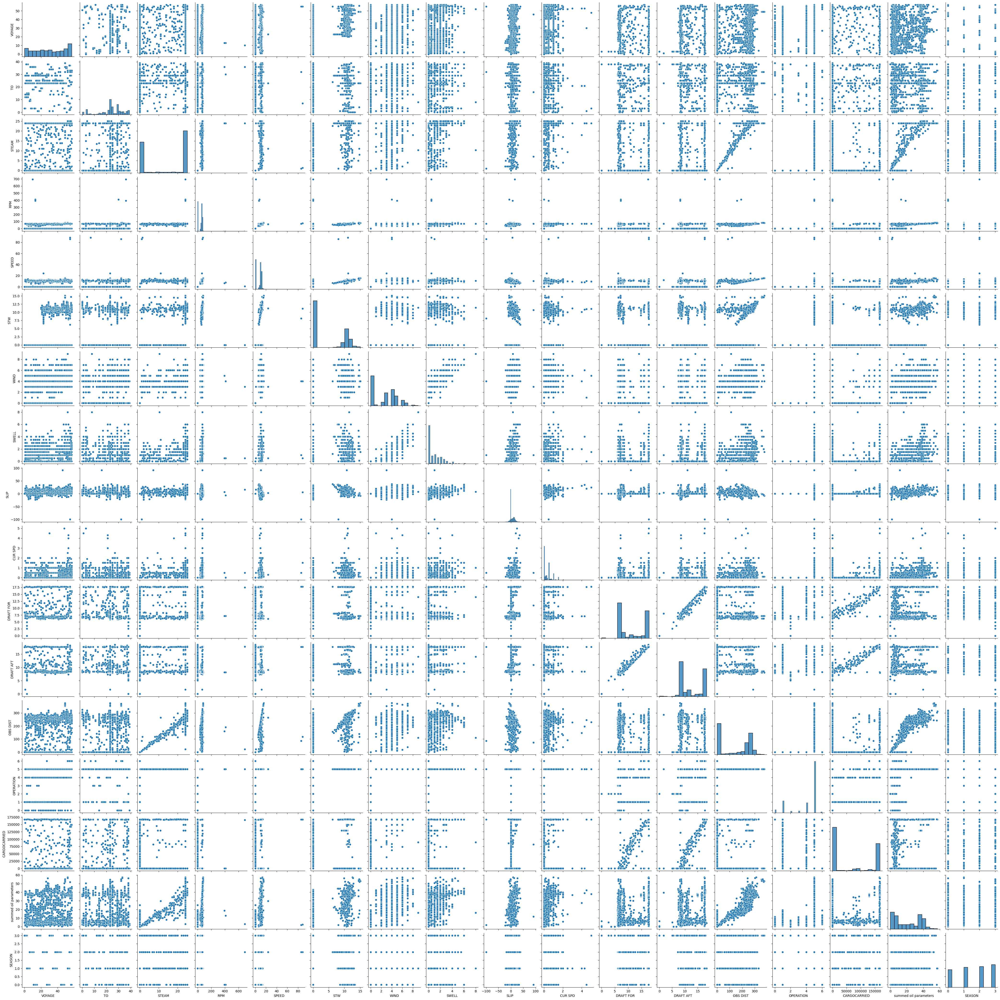

In [ ]:
# Create a pairplot to visualize scatter plots for every pair of columns
sns.pairplot(df_numeric)

# Display the plots
plt.show()

### **Conclusion**
Based on the pairplot, we hypothesize that the following pairs of variables may have linear correlations:
1. DRAFT FOR vs DRAFT AFT
2. CARGOCARRIED vs DRAFT FOR
3. CARGOCARRIED vs DRAFT AFT
4. summed oil parameters vs STEAM
5. summed oil parameters vs OBS DIST

To validate this, we apply the Pearson correlation test on these pairs.

## Compute Pearson Correlations for Selected Pairs

We compute the Pearson correlation for the specified variable pairs, which checks for linear correlations. This will assist determine whether these pairs have substantial linear relationships.

In [ ]:
# Define pairs to check for Pearson correlation
pair_for_pearson_corroletion = [
    ('DRAFT FOR', 'DRAFT AFT'),
    ('CARGOCARRIED', 'DRAFT FOR'),
    ('CARGOCARRIED', 'DRAFT AFT'),
    ('summed oil parameters', 'STEAM'),
    ('summed oil parameters', 'OBS DIST')
]

# Calculate and print Pearson correlations for each pair
for var1, var2 in pair_for_pearson_corroletion:
    correlation = df_numeric[var1].corr(df_numeric[var2], method='pearson')
    print(f'Pearson correlation between {var1} and {var2}: {correlation:.4f}')

Pearson correlation between DRAFT FOR and DRAFT AFT: 0.9888
Pearson correlation between CARGOCARRIED and DRAFT FOR: 0.9391
Pearson correlation between CARGOCARRIED and DRAFT AFT: 0.9238
Pearson correlation between summed oil parameters and STEAM: 0.8933
Pearson correlation between summed oil parameters and OBS DIST: 0.9266


## Spearman Correlation and Heatmap Visualization
Calculates the Spearman correlation matrix, which identifies monotonic correlations. It is beneficial when linear assumptions are not valid, and it uses a heatmap to illustrate correlations and find strong links.

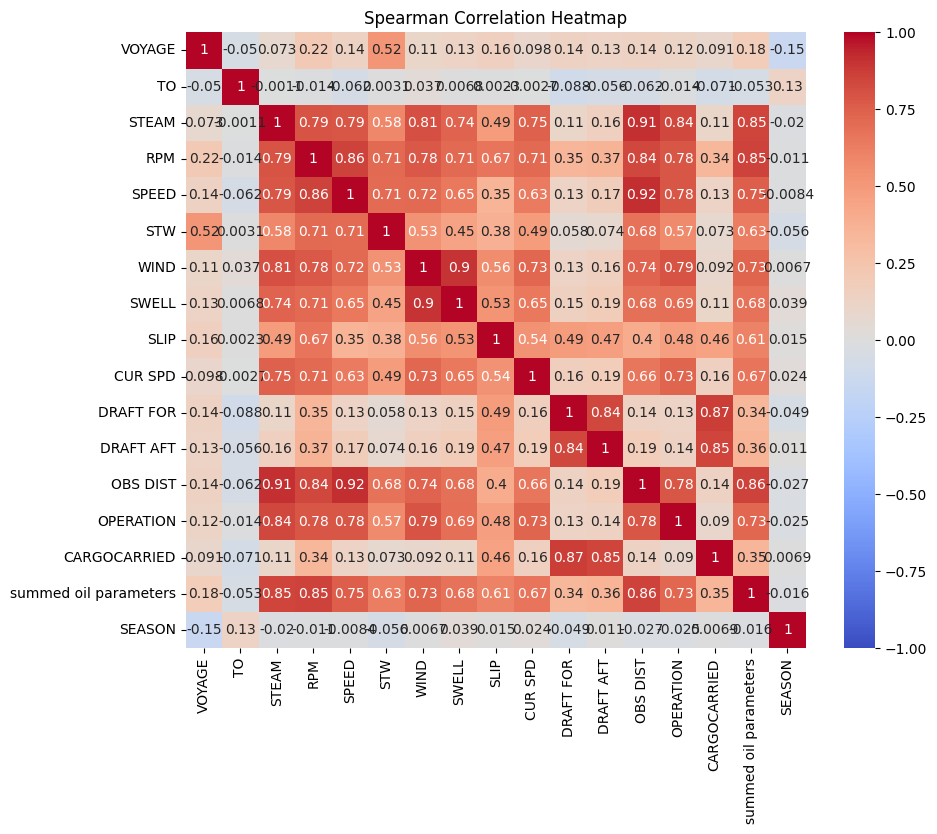

In [ ]:
# Calculate Spearman correlations for monotonic relationships
correlation_matrix_spearman = df_numeric.corr(method='spearman')

# Heatmap for Spearman correlation visualization
plt.figure(figsize=(10,8))
sns.heatmap(correlation_matrix_spearman, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Spearman Correlation Heatmap")
plt.show()

## Identify High Correlations
This function filters and prints correlations that exceed a defined threshold (default is 0.4). This helps focus on the most significant relationships, which may influence modeling and analysis decisions.

In [ ]:
# Function to print high correlations based on a threshold
def print_high_correlations(correlation_matrix, method_name, threshold=0.4):
    print(f"\nHigh correlations in {method_name} correlation matrix:")

    # Loop over correlation pairs to identify high correlations
    for i in range(correlation_matrix.shape[0]):
        for j in range(i + 1, correlation_matrix.shape[1]):
            correlation_value = correlation_matrix.iloc[i, j]
            if abs(correlation_value) > threshold or abs(correlation_value) < (-1)*threshold:
                print(f"Correlation between {correlation_matrix.index[i]} and {correlation_matrix.columns[j]}: {correlation_value}")

# Print high correlations for Spearman method
print_high_correlations(correlation_matrix_spearman, "Spearman")


High correlations in Spearman correlation matrix:
Correlation between VOYAGE and STW: 0.5179749840725612
Correlation between STEAM and RPM: 0.7946258755850352
Correlation between STEAM and SPEED: 0.7854108444233664
Correlation between STEAM and STW: 0.5844588301945848
Correlation between STEAM and WIND: 0.8121952215992081
Correlation between STEAM and SWELL: 0.7366300538946469
Correlation between STEAM and SLIP: 0.49041863281495174
Correlation between STEAM and CUR SPD: 0.7488445330675888
Correlation between STEAM and OBS DIST: 0.9106874911678187
Correlation between STEAM and OPERATION: 0.836168091335179
Correlation between STEAM and summed oil parameters: 0.8467715977348511
Correlation between RPM and SPEED: 0.8590097186932726
Correlation between RPM and STW: 0.714966812530649
Correlation between RPM and WIND: 0.7776004449880165
Correlation between RPM and SWELL: 0.7112225884476625
Correlation between RPM and SLIP: 0.6690957030891105
Correlation between RPM and CUR SPD: 0.71343679710

### **Conclusion**

- `STEAM`, `RPM`, `SPEED`, `WIND`, and `OPERATION` form a strong cluster of highly correlated variables.
- `OBS DIST` shows high correlation with several operational variables.
- `SLIP`, `CUR SPD`, `SWELL`, and `OPERATION` display intermediate correlations with other variables, creating smaller clusters.


Additional significant pairs include:
- `VOYAGE` and `STW`: 0.52
- `DRAFT FOR` and `DRAFT AFT`: 0.84
- `DRAFT FOR` and `CARGOCARRIED`: 0.87
- `DRAFT AFT` and `CARGOCARRIED`: 0.85

# **Machine Learning Models**

## KMeans Model with Feature Selection
Tests KMeans clustering with various feature combinations across buckets. The purpose is to choose the best-performing KMeans model based on silhouette scores. In each iteration, different combinations of variables are deleted in order to determine the best feature subset.

**The features in each bucket were chosen based on their high correlation with each other.**

In [ ]:
# Initialize variables for best model tracking
best_score = -1
best_combination = None
best_kmeans = None
best_clusters = []
kmeans_best_scaled_data = None

# Buckets with high correlation features
bucket1 = ['STEAM', 'RPM', 'SPEED', 'WIND']
bucket2 = ['SLIP', 'CUR SPD', 'SWELL', 'OPERATION']
bucket3 = ['DRAFT FOR', 'DRAFT AFT', 'CARGOCARRIED', 'OBS DIST']

# StandardScaler instance
scaler = StandardScaler()

# Generate all combinations of two or three variables to drop from each bucket
bucket1_combinations = list(combinations(bucket1, 2)) + list(combinations(bucket1, 3))
bucket2_combinations = list(combinations(bucket2, 2)) + list(combinations(bucket2, 3))
bucket3_combinations = list(combinations(bucket3, 2)) + list(combinations(bucket3, 3))

# Loop over all possible selections of variables to drop
for combo1, combo2, combo3 in product(bucket1_combinations, bucket2_combinations, bucket3_combinations):
    drop_list = list(combo1) + list(combo2) + list(combo3) + ['VOYAGE', 'TO']
    categorial_variables = [cat for cat in ['OPERATION', 'SEASON'] if cat not in drop_list]
    temp_df = df_numeric.drop(columns=drop_list).copy()
    temp_encoded_df = pd.get_dummies(temp_df, columns=categorial_variables, drop_first=True)
    scaled_data = scaler.fit_transform(temp_encoded_df)

    # Fit KMeans model and calculate silhouette score
    kmeans = KMeans(n_clusters=3, init='k-means++', random_state=42)
    clusters = kmeans.fit_predict(scaled_data)
    score = silhouette_score(scaled_data, clusters)

    # Update best model if the score is higher
    if score > best_score:
        best_score = score
        best_combination = (combo1, combo2, combo3)
        best_kmeans = kmeans
        best_clusters = clusters
        kmeans_best_scaled_data = scaled_data

# Output best model results
print("Best combination:", best_combination)
print("Best silhouette score:", best_score)
print("Cluster centers for best model:")
print(best_kmeans.cluster_centers_)


Best combination: (('SPEED', 'WIND'), ('SLIP', 'CUR SPD', 'SWELL'), ('DRAFT FOR', 'DRAFT AFT', 'CARGOCARRIED'))
Best silhouette score: 0.4312094231795998
Cluster centers for best model:
[[ 0.7166041   0.64078035  0.50763699  0.70465652  0.62244416 -0.41525674
  -0.14680505 -0.15515822 -0.37757381  0.75960266 -0.10175081 -0.01396212
   0.07628223 -0.04775967]
 [-1.21057443 -1.10588858 -0.85509725 -1.19011331 -1.02234318  2.09901675
  -0.14680505 -0.15515822 -0.37757381 -1.31647775  0.51432436 -0.06528092
   0.18080313 -0.0500137 ]
 [-1.20432405 -1.05825253 -0.85509725 -1.18446625 -1.06930913 -0.41525674
   0.56118793  0.59311937  1.44334175 -1.25009146 -0.10175081  0.09424864
  -0.37485422  0.18436503]]


## 3D PCA Visualization for KMeans Clusters
To acquire insights into cluster separation, the data is reduced to three dimensions using PCA and the KMeans clusters are visualized in 3D space.

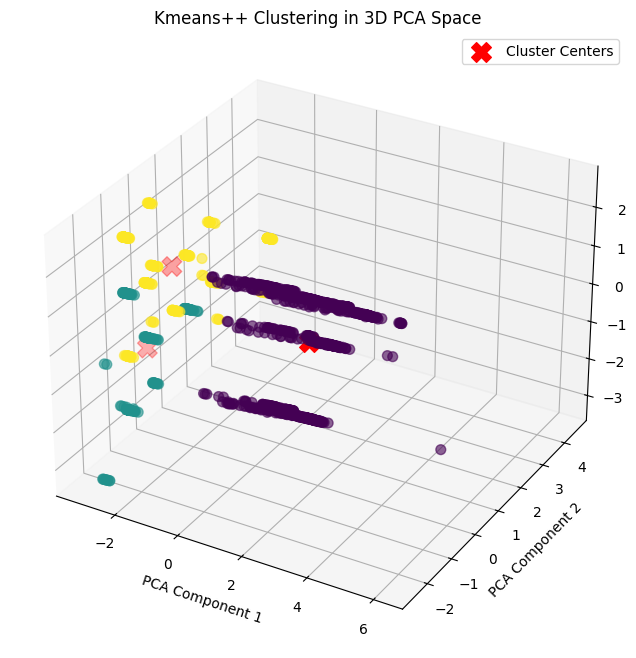

In [ ]:
pca = PCA(n_components=3)
reduced_data_3d = pca.fit_transform(kmeans_best_scaled_data)
reduced_cluster_centers = pca.transform(best_kmeans.cluster_centers_)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(reduced_data_3d[:, 0], reduced_data_3d[:, 1], reduced_data_3d[:, 2],
           c=best_clusters, cmap='viridis', s=50, alpha=0.6)
ax.scatter(reduced_cluster_centers[:, 0], reduced_cluster_centers[:, 1], reduced_cluster_centers[:, 2], c='red', marker='X', s=200, label='Cluster Centers')
ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
plt.title('Kmeans++ Clustering in 3D PCA Space')
plt.legend()
plt.show()

## Pair Plot of Clusters
Plots a pairplot to visually evaluate clustering results based on certain variables. The clusters are separated by color.

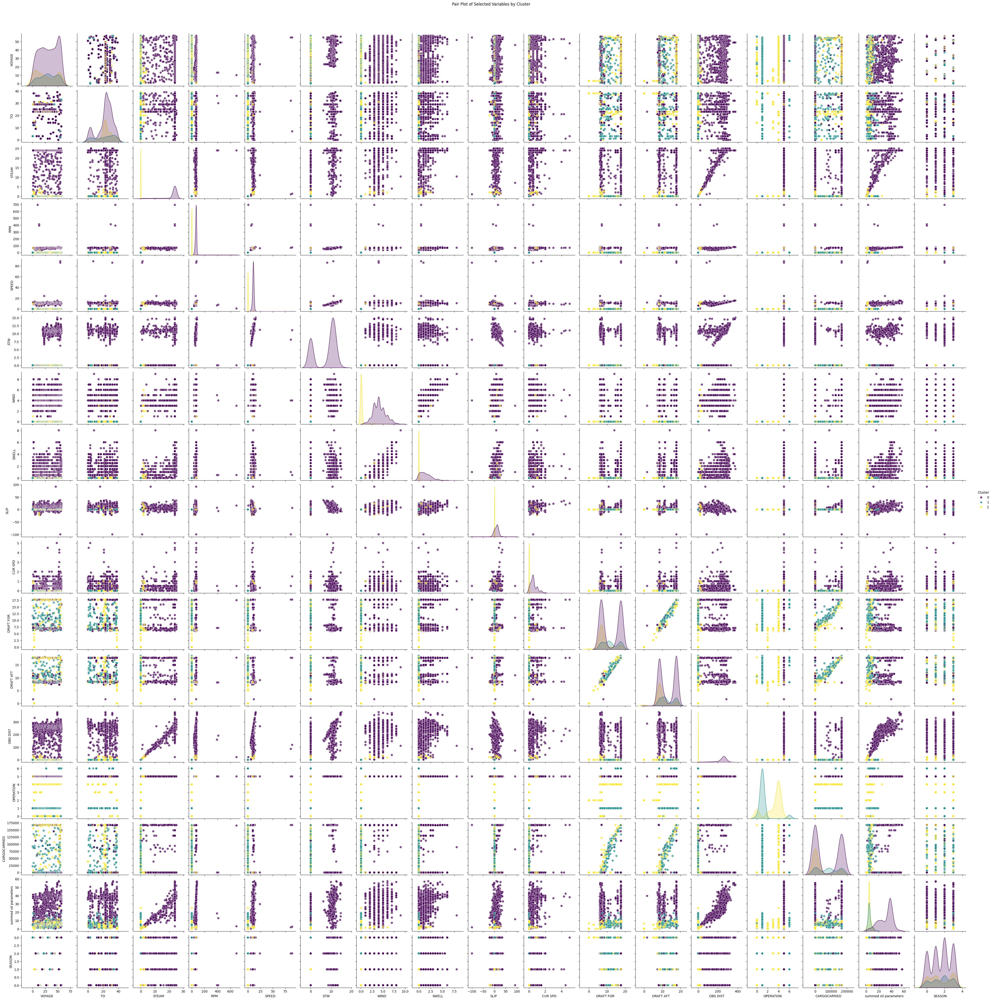

In [ ]:
temp_df = df_numeric.copy()
temp_df['Cluster'] = best_clusters

# Plotting a pairplot for the selected variables, colored by cluster
sns.pairplot(temp_df, hue='Cluster', palette='viridis', plot_kws={'alpha':0.7, 's':50})
plt.suptitle('Pair Plot of Selected Variables by Cluster', y=1.02)
plt.show()

### **In conclusion**,
the KMeans++ clustering model effectively identified multiple clusters within the dataset, as shown in the 3D PCA plot and pair plot visualizations. The model located distinct cluster centers, capturing core data patterns, though some overlap between clusters suggests partial similarity in feature values across groups. While certain features provided strong separation, others displayed overlap, indicating weaker influence on cluster distinction. This clustering likely reflects different operational states or modes within the data. Further refinement through feature engineering, additional dimensionality reduction, or alternative clustering algorithms could improve separability and model performance.

## Random Forest Regressor Model for Fuel Consumption Prediction

Since the KMeans++ model did not fully meet our goal of identifying abnormal fuel consumption patterns, we turned to a Random Forest Regressor model to predict the ship's fuel consumption. With high predictive accuracy, this model can serve as a baseline: significant deviations between actual and predicted fuel consumption could indicate potential issues such as malfunctions or fuel theft.

This section of code builds and evaluates a Random Forest Regressor model to predict fuel consumption based on selected features.


### **Step-by-Step Explanation:**

**Data Standardization:**

The features (numerical columns in `columns_to_sum`) are standardized using StandardScaler to normalize the data to have a mean of 0 and standard deviation of 1.
After scaling, the standardized data is converted back into a DataFrame, and the target column summed oil parameters is added back to `my_scaled_data`.
**Data Preparation:**

The target variable y is set to the summed oil parameters column, while the rest of the columns serve as features (X).
If there are any categorical features, they are one-hot encoded using `pd.get_dummies()` to make the data suitable for machine learning.
`Random Forest Regressor:`

A RandomForestRegressor model is initialized and trained on the training data (`X_train` and `y_train`). The model uses multiple decision trees to create robust predictions by averaging the output of these trees.
**Model Evaluation:**

The model’s performance is evaluated using Mean Squared Error (MSE) and the R² Score. MSE measures the average squared difference between predicted and actual values (lower values are better), while the R² Score indicates how well the model explains variance in the data (values closer to 1 are better).

## Standardize the Data
Scales the selected columns while reintroducing the target column for model training.

In [ ]:
# Standardize the data
X_scaler = df_numeric.drop(columns=['summed oil parameters'])

scaler = StandardScaler()
my_scaled_data = scaler.fit_transform(X_scaler)

my_scaled_data = pd.DataFrame(my_scaled_data, columns=X_scaler.columns)
my_scaled_data['summed oil parameters'] = df_numeric['summed oil parameters']

## Model Preparation and Training
Data are prepared, the Random Forest Regressor is trained, and the model's performance is assessed.

In [ ]:

# Prepare the data for training
X = my_scaled_data.drop(columns=['summed oil parameters'])
y = my_scaled_data['summed oil parameters']

# Select only columns that are of type float
x_encoded = pd.get_dummies(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(x_encoded, y, test_size=0.2, random_state=42)

# Initialize and fit the RandomForestRegressor
rf_model = RandomForestRegressor()
rf_model.fit(X_train, y_train)

# Predict on the test set
y_pred = rf_model.predict(X_test)

# Evaluate the performance of the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

Mean Squared Error: 7.380703464960271
R^2 Score: 0.9676221630951041


## Visualization of Actual vs Predicted Values

Generate a scatter plot comparing actual and expected fuel consumption numbers to graphically evaluate model performance.

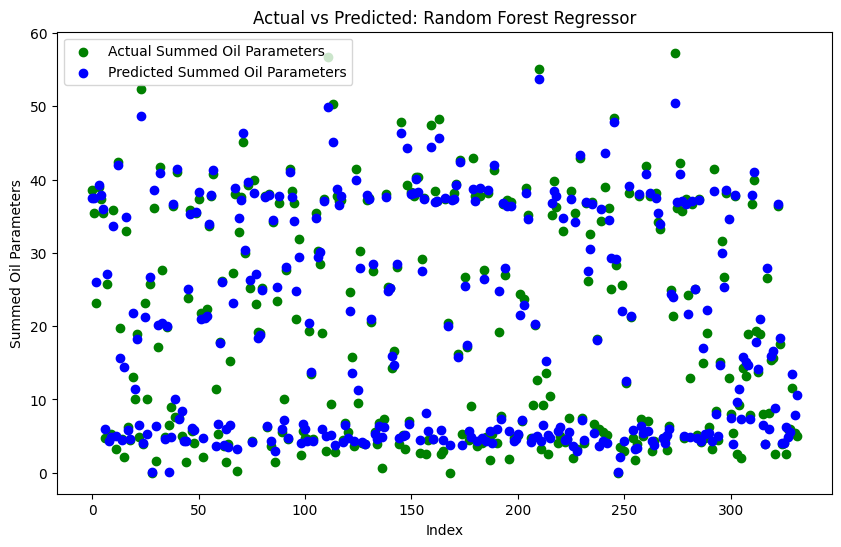

In [ ]:

# Create the figure and axis
plt.figure(figsize=(10, 6))

# Scatter plot for actual values (green)
plt.scatter(range(len(y_test)), y_test, color='green', label='Actual Summed Oil Parameters')

# Scatter plot for predicted values (blue)
plt.scatter(range(len(y_pred)), y_pred, color='blue', label='Predicted Summed Oil Parameters')

# Add labels and title
plt.xlabel('Index')
plt.ylabel('Summed Oil Parameters')
plt.title('Actual vs Predicted: Random Forest Regressor')

# Add legend to differentiate between actual and predicted values
plt.legend()

# Display the plot
plt.show()

### **To conclude,**

The Random Forest Regressor model demonstrates high accuracy in predicting the summed oil parameters, with a Mean Squared Error (MSE) of 7.38 and an R² Score of 0.968, indicating that it captures approximately 97% of the variance in the data. The scatter plot comparing actual versus predicted values shows a close alignment between the two, suggesting the model effectively generalizes to unseen data points. However, some variations between predicted and actual values can still be observed, suggesting room for further fine-tuning or exploration of additional features to enhance prediction accuracy.

# **Other machine learning models that we tested but didn't succeed**

## Gaussian Mixture Model (GMM) with Feature Selection
Using the silhouette score, a variety of GMM parameter and feature subset combinations are tested to determine the best-performing model.

In [ ]:
# Initialize variables for best model tracking
best_score = -1
best_combination = None
best_gmm = None
best_gmm_labels = None
best_params = {}
gmm_best_scaled_data = None

# GMM parameter grid
n_components_options = [2, 3]  # Different numbers of clusters
covariance_types = ['full', 'tied', 'diag', 'spherical']  # Different covariance types

# StandardScaler instance
scaler = StandardScaler()

# Generate all combinations of variables to drop from each bucket
bucket1_combinations = list(combinations(bucket1, 1)) + list(combinations(bucket1, 2)) + list(combinations(bucket1, 3))
bucket2_combinations = list(combinations(bucket2, 1)) + list(combinations(bucket2, 2)) + list(combinations(bucket2, 3))
bucket3_combinations = list(combinations(bucket3, 1)) + list(combinations(bucket3, 2)) + list(combinations(bucket3, 3))

# Loop over possible feature selections and GMM parameters
for combo1, combo2, combo3 in product(bucket1_combinations, bucket2_combinations, bucket3_combinations):
    drop_list = list(combo1) + list(combo2) + list(combo3) + ['VOYAGE', 'TO']
    temp_df = df_numeric.drop(columns=drop_list).copy()
    scaled_data = scaler.fit_transform(temp_encoded_df)

    # Loop over different GMM parameters
    for n_components, covariance_type in product(n_components_options, covariance_types):
        gmm = GaussianMixture(n_components=n_components, covariance_type=covariance_type, random_state=42)
        gmm_labels = gmm.fit_predict(scaled_data)
        score = silhouette_score(scaled_data, gmm_labels)

        # Update best model if the score is higher
        if score > best_score:
            best_score = score
            best_combination = (combo1, combo2, combo3)
            best_gmm = gmm
            best_gmm_labels = gmm_labels
            best_params = {'n_components': n_components, 'covariance_type': covariance_type}
            gmm_best_scaled_data = scaled_data

# Output best model results
print("Best combination of dropped variables:", best_combination)
print("Best GMM parameters:", best_params)
print("Best silhouette score for GMM:", best_score)

Best combination of dropped variables: (('STEAM',), ('SLIP',), ('DRAFT FOR',))
Best GMM parameters: {'n_components': 2, 'covariance_type': 'spherical'}
Best silhouette score for GMM: 0.2979713959543259


## Pair Plot for GMM Clusters
A pairplot is used to visualize the Gaussian Mixture Model clusters and determine how well-separated they are based on the variables selected.

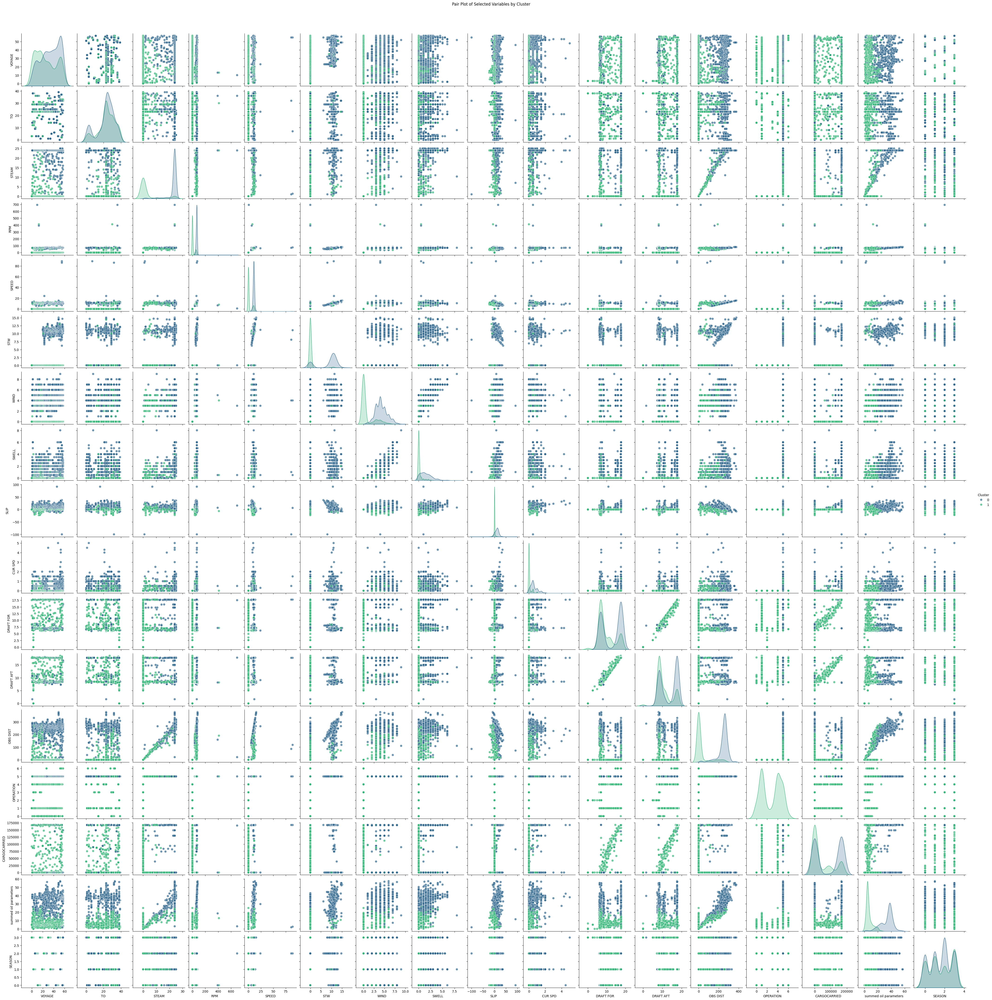

In [ ]:
temp_df = df_numeric.copy()
temp_df['Cluster'] = best_gmm_labels # Add cluster labels
sns.pairplot(temp_df, hue='Cluster', palette='viridis', plot_kws={'alpha':0.7, 's':50})
plt.suptitle('Pair Plot of Selected Variables by Cluster', y=1.02)
plt.show()

## 3D PCA Plot for GMM Clustering
The clustered data is projected into 3D using PCA and shown to show cluster separation in a reduced dimensional space.

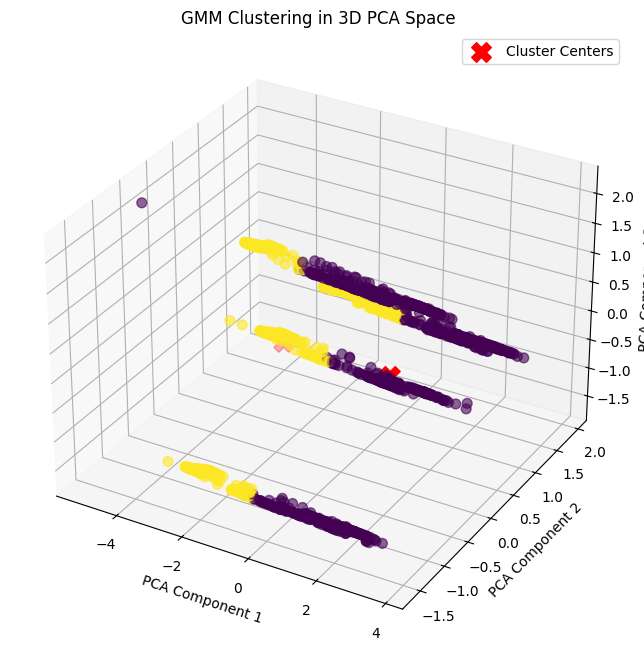

In [ ]:
pca = PCA(n_components=3)
reduced_data_3d = pca.fit_transform(gmm_best_scaled_data)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(reduced_data_3d[:, 0], reduced_data_3d[:, 1], reduced_data_3d[:, 2],
           c=best_gmm_labels, cmap='viridis', s=50, alpha=0.6)
ax.scatter(*pca.transform(best_gmm.means_).T, c='red', marker='X', s=200, label='Cluster Centers')
ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
plt.title('GMM Clustering in 3D PCA Space')
plt.legend()
plt.show()

### **conclusion**
The GMM clustering approach achieved moderate success in identifying patterns in the ship's fuel consumption data, with an optimal configuration of two components and a spherical covariance structure. The silhouette score of 0.298 indicates weak cluster separation, suggesting that the clusters are not well-defined and may overlap. The model performed best when excluding "STEAM," "SLIP," and "DRAFT FOR," implying that these variables contributed less to distinguishing fuel consumption patterns. However, due to the low silhouette score, the model's reliability for accurately identifying distinct operational states or consumption anomalies is limited. Thus, while GMM offers some insight, it may not be ideal for precise or actionable clustering in this context without further refinement or additional features.

## Linear Regression Model with Correlated Pairs
### **Model Summary:**
This section builds a Linear Regression model using only the variables with significant linear correlation to the target, `summed oil parameters`:

*   `DRAFT FOR`
*   `DRAFT AFT`
*   `STEAM`
*   `OBS DIST`
*   `summed oil parameters`

### **Step-by-Step Explanation:**



1. **Data Preparation:**
In `linear_df`, we select the variables with high linear correlation with the target variable (`summed oil parameters`).
Data is split into features (X) and target (y), followed by a train-test split to evaluate model performance.

2. **Feature Standardization:**
The features are standardized using StandardScaler to ensure consistency across feature ranges, improving model training stability.

3. **Model Training and Evaluation:**
A Linear Regression model is trained on the scaled training data.
Performance is evaluated using Mean Squared Error (MSE) and the R² Score. MSE measures the average squared difference between predicted and actual values (lower values are better), while the R² Score explains how well the model captures variance in the data (closer to 1 is better).

4. **Coefficient Analysis:**
The coefficients of the Linear Regression model are displayed to understand the influence of each feature on the target variable.

5.**Visualization of Actual vs Predicted Values:**
A scatter plot is generated to visually compare the actual and predicted fuel consumption values.

### Model Training and Evaluation
The Linear Regression model is trained using the selected variables and then evaluated on the test data.

In [ ]:
# Creating a new dataframe including only the columns having linear correlation.
linear_df = df_numeric[['DRAFT FOR', 'DRAFT AFT', 'CARGOCARRIED', 'summed oil parameters', 'STEAM', 'OBS DIST']].copy()

# Prepare the data for training
X = linear_df.drop(columns=['summed oil parameters'])
y = linear_df['summed oil parameters']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train a Linear Regression model
model = LinearRegression()
model.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

Mean Squared Error: 22.296889611788036
R-squared: 0.9021875003156183


### Coefficient Analysis
The coefficients of the model are displayed to analyze the impact of each feature on the target variable.

In [ ]:
# Create a DataFrame for better visualization
coef_df = pd.DataFrame(model.coef_, index=X.columns, columns=['Coefficient'])
print(coef_df)

              Coefficient
DRAFT FOR        2.960875
DRAFT AFT       -0.598276
CARGOCARRIED     0.963044
STEAM           -4.740566
OBS DIST        18.208526


### Actual vs Predicted Plot

This scatter plot visually compares actual and predicted values of the target variable to evaluate model performance.

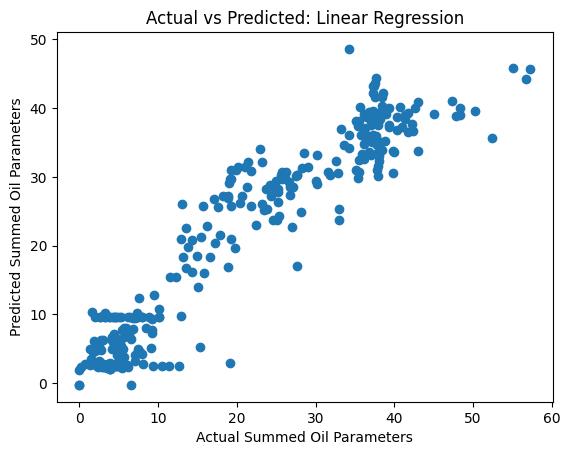

In [ ]:
# Plot predicted vs actual values
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Summed Oil Parameters')
plt.ylabel('Predicted Summed Oil Parameters')
plt.title('Actual vs Predicted: Linear Regression')
plt.show()

### **Conclusion**
Due to the limited number of parameters, the model relies heavily on a single influential feature, leading to overfitting rather than learning underlying patterns. As a result, this model is disqualified from further use for fuel consumption prediction.